In [38]:
using Plots; plotlyjs()
using CSV, DataFrames, HDF5, LaTeXStrings
using CurveFit
using Statistics
using Printf

# GGE

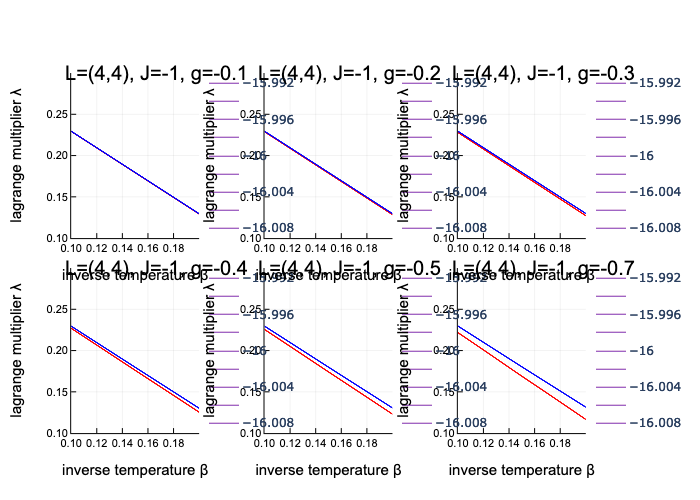

In [47]:
gs = [-0.1,-0.2,-0.3,-0.4,-0.5,-0.7]
L = (4,4)
J = -1
h = -0.


# dws = [8.02006, 8.08106, 8.18552, 8.3364,8.5298,8.763,9.044,9.895,10.78,9.55,11.46] ### only 8 most important ev
# dws2 = [8.02006, 8.137, 8.3381, 8.5918,8.893,9.49,10.13,12.6556] ### only most important ev up to tolerance of 
# dws3 = [8.02006, 8.08106, 8.18542, 8.3358,8.5266,9.1032,9.2694,10.9659] ### all ev in N=8 sector
# dws4 = [8.03999, 8.15987, 8.35917, 8.634378, 8.96957, 9.6386, 10.4036, 12.5456, 13.1155, 13.33723,13.64116] ### diagonal density matrix approach

res = map(gs) do g
    df = CSV.read("../data/thermGGE2_ED_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    p = plot(title = "L=($(L[1]),$(L[2])), J=$(J), g=$(g)", xlabel = "inverse temperature β", ylabel = "lagrange multiplier λ", clim=(-16.01,-15.99), ylim = (0.1,0.3),)
    contour!(df[:,"beta"], df[:,"lambd"], df[:,"H_Z"],  c=:red)
    contour!(df[:,"beta"], df[:,"lambd"], df[:,"N_Z"], color = :blue)
    return p
    # (a,b) = linear_fit(df[:,"beta"], df[:,"H_Z"])
    # # scatter(df[:,"beta"], df[:,"H_Z"])
    # # plot!(df[:,"beta"], a .+ b .* df[:,"beta"])

    # beta_th = (-16 - a)/b

    # (a2,b2) = linear_fit(df[:,"beta"], df[:,"N_Z"])

    # N_th = a2 + beta_th * b2

    # dfE = CSV.read("../data/obs_ED_n=3_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    # return (N_th, mean(dfE[end-200:end,"N"]), beta_th)
end

plot(res..., 
            legend = :topleft,
            dpi=100, size = (1500,700)
        )
# scatter!(abs.(gs), [(32+r[2])/2 for r in res], markersize = 6, markershape = :xcross, label="mean value of time evol")
# scatter!(abs.(gs), dws3, markersize = 8, markershape = :star, label="mean of dw-length obtained from the overlap\nof the initial state with all N=8 states")
# scatter!(abs.(gs), [(32+r[1])/2 for r in res], markersize = 5, markershape = :rect, label="thermal value")
# scatter!(abs.(gs), dws, markersize = 5, markershape = :diamond, label="mean value using only the 8 most relevant states", opacity = 0.5)
# scatter!(abs.(gs)[1:length(dws4)], dws4, markersize = 8, markershape = :star, label="diagonal density matrix", opacity = 0.5)
# savefig("~/Desktop/4_4_dw_thermal.png")

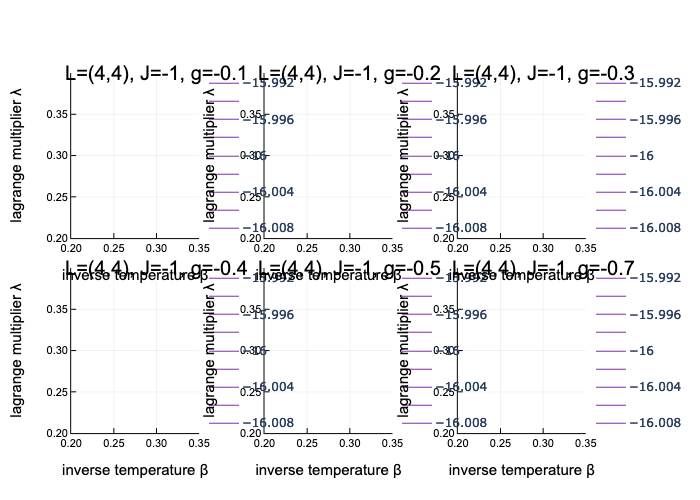

In [37]:
gs = [-0.1,-0.2,-0.3,-0.4,-0.5,-0.7]
L = (4,4)
J = -1
h = -0.
 dws4 = [8.03999, 8.15987, 8.35917, 8.634378, 8.96957, 9.6386, 10.4036, 12.5456, 13.1155, 13.33723,13.64116] ### diagonal density matrix approach

res = map(gs) do g
    df = CSV.read("../data/thermGGE3_ED_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    p = plot(title = "L=($(L[1]),$(L[2])), J=$(J), g=$(g)", xlabel = "inverse temperature β", ylabel = "lagrange multiplier λ", clim=(-16.01,-15.99))#ylim = (0,0.03), ,)
    contour!(df[:,"beta"], df[:,"lambd"], df[:,"H_Z"],  c=:red)
    contour!(df[:,"beta"], df[:,"lambd"], df[:,"N_Z"], color = :blue)
    return p
end

plot(res..., 
            legend = :topleft,
            dpi=100, size = (1500,700)
        )

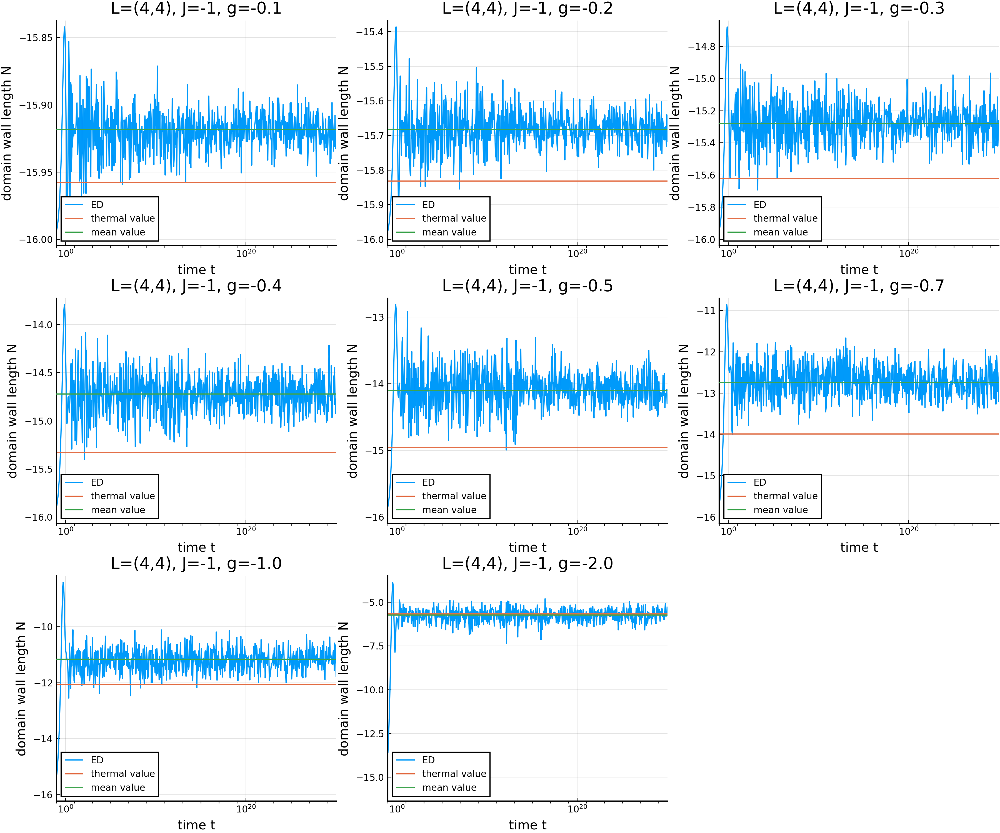

In [87]:
gs = [-0.1,-0.2,-0.3,-0.4,-0.5,-0.7,-1.,-2.]

beta_ths = []

ps = map(gs) do g
    L = (4,4)
    J = -1
    h = -0.

    df = CSV.read("../data/therm_ED_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    (a,b) = linear_fit(df[:,"beta"], df[:,"H_Z"])
    # scatter(df[:,"beta"], df[:,"H_Z"])
    # plot!(df[:,"beta"], a .+ b .* df[:,"beta"])

    beta_th = (-16 - a)/b
    push!(beta_ths, beta_th)

    (a2,b2) = linear_fit(df[:,"beta"], df[:,"N_Z"])

    N_th = a2 + beta_th * b2

    dfE = CSV.read("../data/obs_ED_n=3_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    plot(title = "L=($(L[1]),$(L[2])), J=$(J), g=$(g)", xlabel = "time t", ylabel = "domain wall length N",
                xlim = (0.1,1e30), xaxis = :log,
                # ylim = (-16,-5), # yaxis = :log,
                legend = :bottomleft,
            )
    plot!(dfE[:,"t"], dfE[:,"N"], label="ED")
    # vline!([beta_th])
    hline!([N_th], label = "thermal value")
    hline!([mean(dfE[end-200:end,"N"])], label = "mean value")
end

plot(ps..., dpi=300, size = (1200,1000))
# savefig("~/4_4_dw_thermal.png")

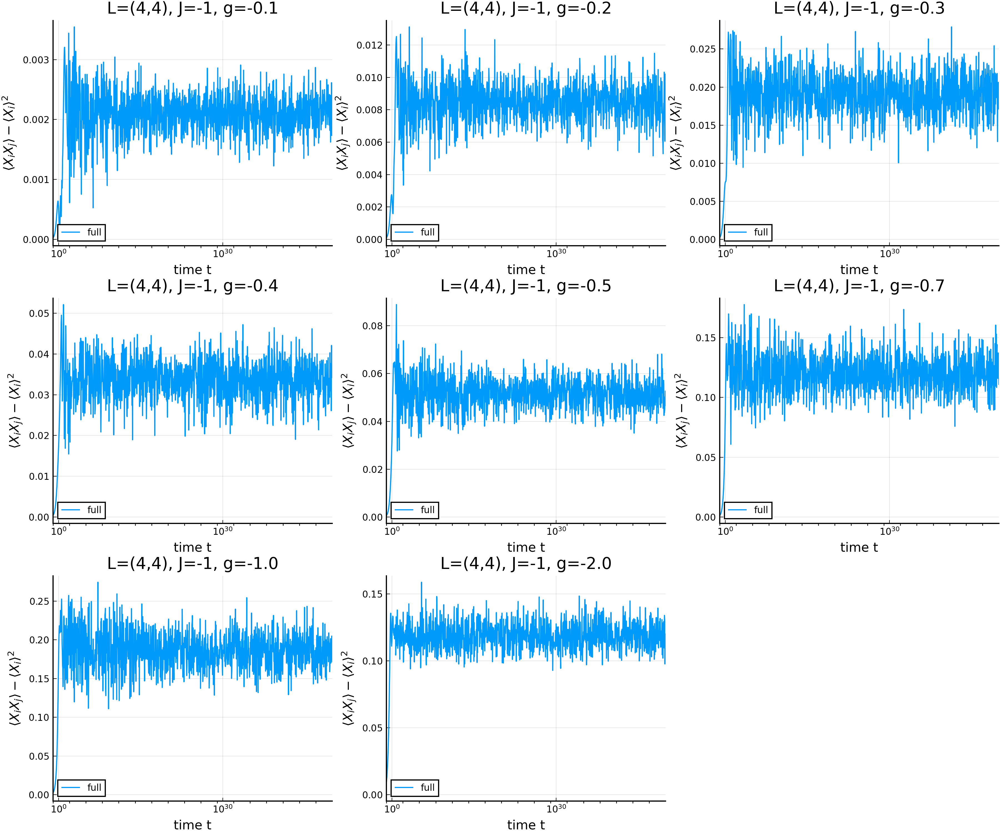

In [102]:
gs = [-0.1,-0.2,-0.3,-0.4,-0.5,-0.7,-1.0,-2.0]

pimbs = map(gs) do g
    L = (4,4)
    J = -1
    h = -0.

    dfE  = CSV.read("../data/obs_ED_n=3_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv",    DataFrame)

    plot(title = "L=($(L[1]),$(L[2])), J=$(J), g=$(g)", xlabel = "time t", ylabel = L"\langle X_i X_j \rangle - \langle X_i \rangle^2",
                xlim = (0.1,1e50), xaxis = :log,
                # ylim = (-1,1),
                legend = :bottomleft,
            )

    plot!(dfE[:,"t"], dfE[:,"twoCorrel"] .- dfE[:,"xPol"] .^2, label="full")
end

plot(pimbs..., dpi=300, size = (1200,1000))
# savefig("~/4_4_dressed_dw.png")

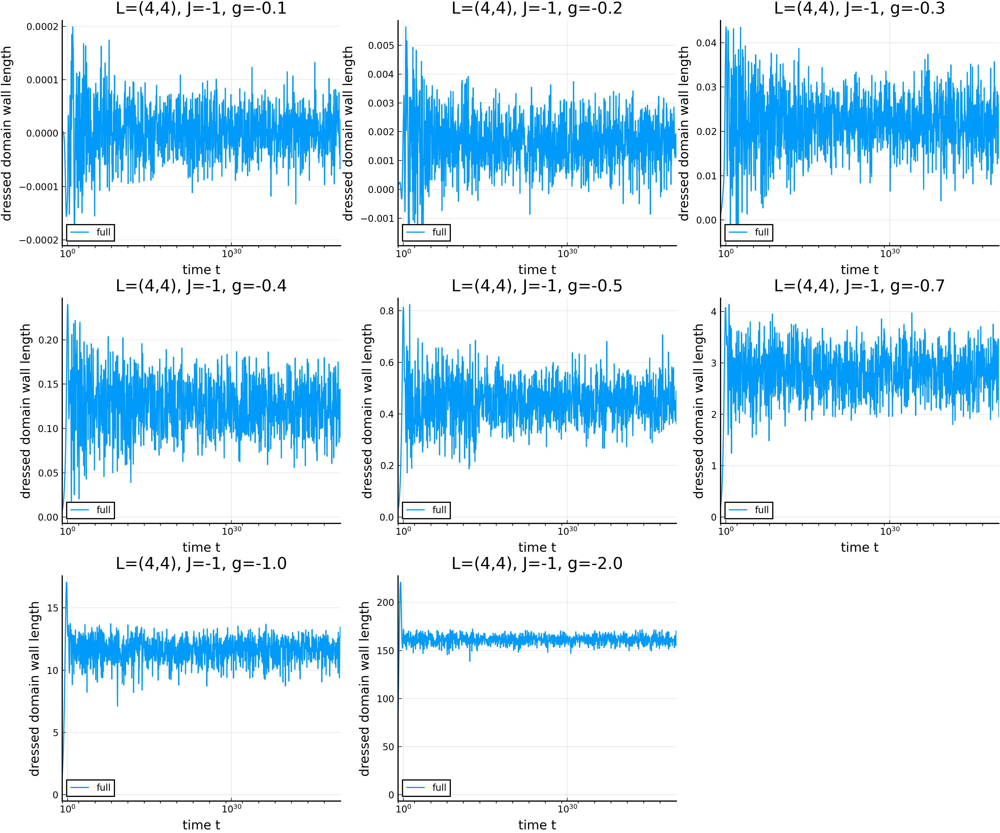

In [92]:
gs = [-0.1,-0.2,-0.3,-0.4,-0.5,-0.7,-1.0,-2.0]

pimbs = map(gs) do g
    L = (4,4)
    J = -1
    h = -0.

    dfE  = CSV.read("../data/obs_ED_n=3_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv",    DataFrame)

    plot(title = "L=($(L[1]),$(L[2])), J=$(J), g=$(g)", xlabel = "time t", ylabel = "dressed domain wall length",
                xlim = (0.1,1e50), xaxis = :log,
                # ylim = (-1,1),
                legend = :bottomleft,
            )

    plot!(dfE[:,"t"], (dfE[:,"N"] .+ dfE[:,"N_corr"]) .- (dfE[1,"N"] + dfE[1,"N_corr"]), label="full")
end

plot(pimbs..., dpi=300, size = (1200,1000))
# savefig("~/4_4_dressed_dw.png")

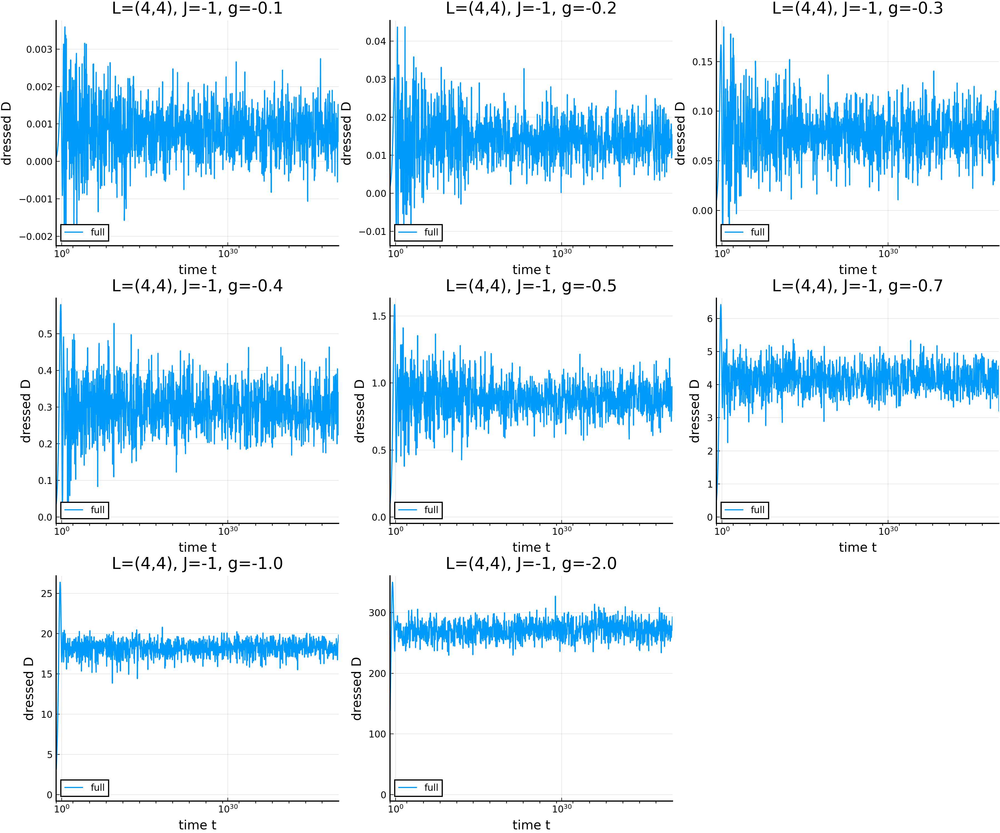

In [93]:
gs = [-0.1,-0.2,-0.3,-0.4,-0.5,-0.7,-1.0,-2.0]

pimbs = map(gs) do g
    L = (4,4)
    J = -1
    h = -0.

    dfE  = CSV.read("../data/obs_ED_n=3_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv",    DataFrame)

    plot(title = "L=($(L[1]),$(L[2])), J=$(J), g=$(g)", xlabel = "time t", ylabel = "dressed D",
                xlim = (0.1,1e50), xaxis = :log,
                # ylim = (-1,1),
                legend = :bottomleft,
            )

    plot!(dfE[:,"t"], (dfE[:,"D"] .+ dfE[:,"D_corr"]) .- (dfE[1,"D"] + dfE[1,"D_corr"]), label="full")
end

plot(pimbs..., dpi=300, size = (1200,1000))
# savefig("~/4_4_dressed_D.png")

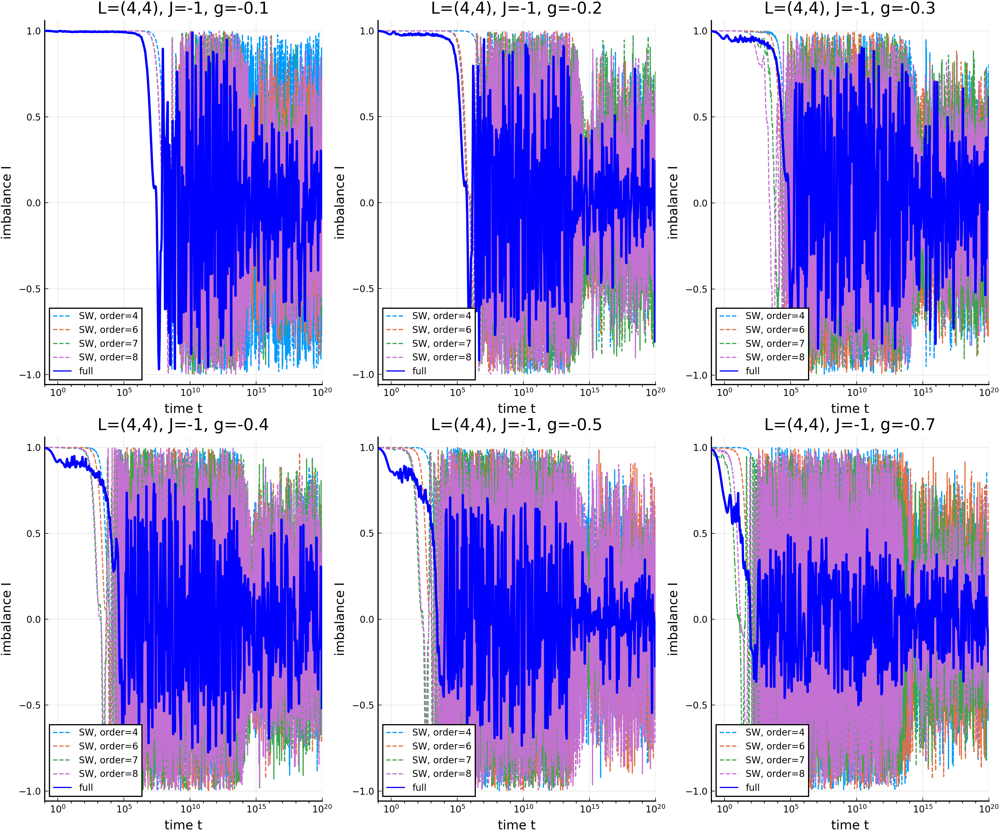

In [94]:
gs = [-0.1,-0.2,-0.3,-0.4,-0.5,-0.7]

pimbs = map(gs) do g
    L = (4,4)
    J = -1
    h = -0.

    dfE  = CSV.read("../data/obs_ED_n=3_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv",    DataFrame)
    dfS1 = CSV.read("../data/obs_SWred_n=1_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    dfS2 = CSV.read("../data/obs_SWred_n=2_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    dfS3 = CSV.read("../data/obs_SWred_n=3_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    dfS4 = CSV.read("../data/obs_SWred_n=4_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    dfS5 = CSV.read("../data/obs_SWred_n=5_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    dfS6 = CSV.read("../data/obs_SWred_n=6_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    dfS7 = CSV.read("../data/obs_SWred_n=7_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)

    plot(title = "L=($(L[1]),$(L[2])), J=$(J), g=$(g)", xlabel = "time t", ylabel = "imbalance I",
                xlim = (0.1,1e20), xaxis = :log,
                # ylim = (-1,1),
                legend = :bottomleft,
            )

    # plot!(dfS2[:,"t"], dfS2[:,"imb"], label="SW, order=3", linestyle=:dash)
    plot!(dfS3[:,"t"], dfS3[:,"imb"], label="SW, order=4", linestyle=:dash)
    # plot!(dfS4[:,"t"], dfS4[:,"imb"], label="SW, order=5", linestyle=:dash)
    plot!(dfS5[:,"t"], dfS5[:,"imb"], label="SW, order=6", linestyle=:dash)
    plot!(dfS6[:,"t"], dfS6[:,"imb"], label="SW, order=7", linestyle=:dash)
    plot!(dfS7[:,"t"], dfS7[:,"imb"], label="SW, order=8", linestyle=:dash)
    plot!(dfE[:,"t"], dfE[:,"imb"],   label="full", color=:blue, linewidth = 2)
end

plot(pimbs..., dpi=300, size = (1200,1000))
# savefig("~/4_4_imbalance.png")

In [ ]:

L = (4,4)
J = -1
# g = -0.5
h = -0.

gs = [-0.3]#,-0.2,-0.3,-0.4]

pimbs = map(gs) do g
    #dfE = CSV.read("../data/obs_ED_longtime_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    dfE2 = CSV.read("../data/obs_ED2_n=3_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)

    plot(title = "L=($(L[1]),$(L[2])), J=$(J), g=$(g)", xlabel = "time t", ylabel = "corrected domain wall length",
                xlim = (0.1,1e50), xaxis = :log,
                ylim = (-1,1),
                legend = :bottomleft,
            )
    plot!(dfE2[:,"t"], (dfE2[:,"N"] .+ dfE2[:,"N_corr"]) .- (dfE2[1,"N"] + dfE2[1,"N_corr"]), label="ED2")
    # plot!(dfE2[:,"t"], dfE2[:,"imb"])
end

plot(pimbs..., dpi=300, size = (1200,1000))
# savefig("corrected_dom_length.png")

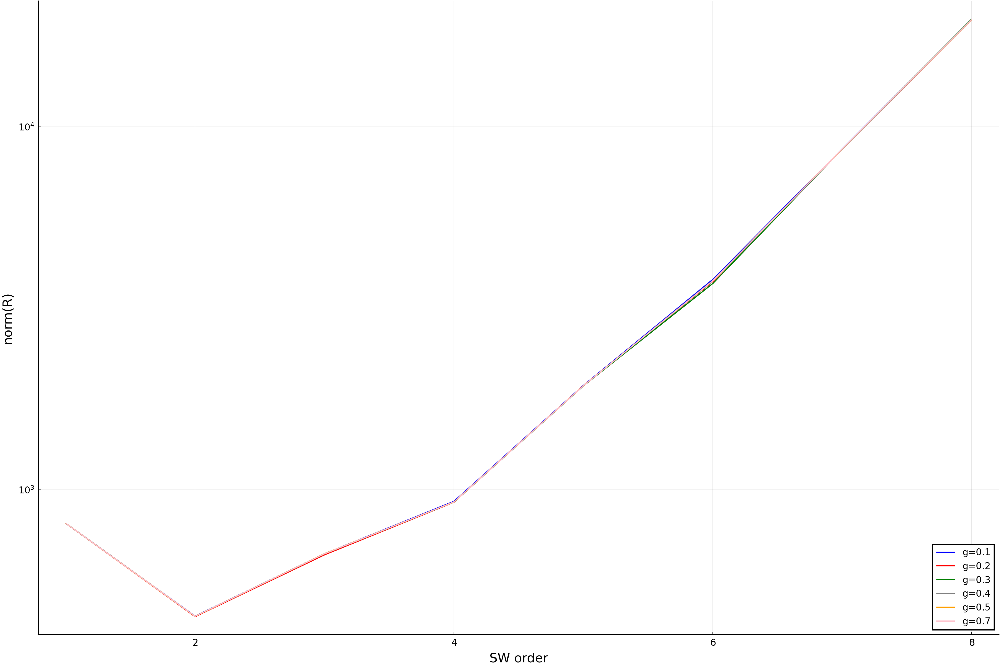

In [16]:
### norms
let 
   gs = [0.1,0.2,0.3,0.4,0.5,0.7]
   colors = [:blue, :red, :green, :grey, :orange, :pink]
   normR = [
    [80.95,4.49,0.667,0.093,0.0194,0.0038,0.00087,0.000198],
    [161.9,17.9,5.3,1.48,0.62,0.24,0.111,0.0506,],
    [242.9,40.37,18,7.5,4.7,2.7,1.9,1.3,],
    [323.8,71.8,42.68,23.7,19.8,15.4,14.2,12.96,],
    [404.8,112.1,83.4,57.9,60.5,58.9,67.92,77.25,],
    [566.7,219.8,228.7,222.5,325.4,443.4,716,1140],
   ]
   p = plot(xlabel = "SW order", #xaxis = :log, #xticks = ([1,2,3,4,5,6,7,8,9,10,20],[1,2,3,4,5,6,7,8,9,10,20]), 
      ylabel = "norm(R)", yaxis = :log, 
      legend = :bottomright,
   )

   for (i,g) in enumerate(gs)
      plot!(normR[i] ./ g .^collect(1:8), label = "g=$(g)", c=colors[i])
      # plot!(normR[i], label = "g=$(g)", c=colors[i])
      # vline!([2 / g], label = "", c=colors[i])
   end
   plot(p, size = (1200,800), dpi = 300)
end

In [ ]:
### norms
let 
   gs = [0.1,0.2,0.3,0.4,0.5,0.7]
   colors = [:blue, :red, :green, :grey, :orange, :pink]
   normV = [
    [10.42, 0.84, 0.14,],
    [41.68, 6.74,2.17,],
    [93.79,22.74,10.96,5.86,3.61],
    [166.73,53.91,34.65,24.7,20.29,],
    [260.52,105.29,84.6,75.35,77.40,84.11,],
    [510.62,288.92,325.01,405.27,582.77,],
    [1042.09,842.33,1353.66,2411.34,4953.50],
    [4168.36,6738.644,21658.53,77163.01,317024,],
   ]
   p = plot(xlabel = "SW order", xaxis = :log, xticks = ([1,2,3,4,5,6,7,8,9,10,20],[1,2,3,4,5,6,7,8,9,10,20]), 
      ylabel = "norm(V)", yaxis = :log, 
      legend = :bottomright,
   )

   for (i,g) in enumerate(gs)
      plot!(normV[i], label = "g=$(g)", c=colors[i])
      # vline!([2 / g], label = "", c=colors[i])
   end
   plot(p, size = (1200,800), dpi = 300)
end

In [ ]:
L = (4,4)
J = -1
# g = -0.5
h = -0.

gs = [-0.1,-0.2,-0.3,-0.4]

pimbs = map(gs) do g
    dfE = CSV.read("../data/obs_ED_Dcorr_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    # dfE = CSV.read("../data/obs_Pert_Dcorr_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)

    # pdw = plot(title = "L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)")
    # plot!(dfE[:,"t"], dfE[:,"dw"], label="exact")
    # plot!(dfP[:,"t"], dfP[:,"dw"], label="pert", linestyle = :dash)

    plot(title = "L=($(L[1]),$(L[2])), J=$(J), g=$(g)", xlabel = "time t", ylabel = "corrected domain wall length",
                xlim = (0.1,1000), xaxis = :log,
                ylim = (-1,1),
                legend = :bottomleft,
            )
    # plot!(dfE[:,"t"], (dfE[:,"N"] .+ dfE[:,"N_corr1"]) .- (dfE[1,"N"] + dfE[1,"N_corr1"]), label="corr1")
    # plot!(dfE[:,"t"], (dfE[:,"N"] .+ dfE[:,"N_corr2"]) .- (dfE[1,"N"] + dfE[1,"N_corr2"]), label="corr2")
    # plot!(dfE[:,"t"], (dfE[:,"N"] .+ dfE[:,"N_corr3"]) .- (dfE[1,"N"] + dfE[1,"N_corr3"]), label="corr3")
    plot!(dfE[:,"t"], (dfE[:,"N"] .+ dfE[:,"N_corr4"]) .- (dfE[1,"N"] + dfE[1,"N_corr4"]), label=L"\mathbf{N}")
end

plot(pimbs..., dpi=300, size = (1200,1000))
# savefig("corrected_dom_length.png")

In [ ]:
L = (4,4)
J = -1
# g = -0.5
h = -0.

gs = [-0.1,-0.2,-0.3,-0.4,-0.5,-1.]

pimbs = map(gs) do g
    dfE = CSV.read("../data/obs_ED_Dcorr_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    # dfE = CSV.read("../data/obs_Pert_Dcorr_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)

    # pdw = plot(title = "L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)")
    # plot!(dfE[:,"t"], dfE[:,"dw"], label="exact")
    # plot!(dfP[:,"t"], dfP[:,"dw"], label="pert", linestyle = :dash)

    plot(title = "L=($(L[1]),$(L[2])), J=$(J), g=$(g)", xlabel = "time t", ylabel = "domain wall length without correction",
                xlim = (0.1,1000), xaxis = :log,
                # ylim = (-1,1),
                legend = :bottomleft,
            )
    plot!(dfE[:,"t"], (dfE[:,"N"]) .- (dfE[1,"N"]), label="exact")
end

plot(pimbs..., dpi=300, size = (1200,1000))

In [24]:
### non-periodic ###

L = (4,4)
J = -1
# g = -0.5
h = -0.

gs = [-0.1,-0.2,-0.3,-0.4,-0.5,-0.7,-1.,-2.]

pimbs = map(gs) do g
    dfE = CSV.read("../data/obs_ED_nonperi_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    dfP = CSV.read("../data/obs_Pert_nonperi_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)

    # pdw = plot(title = "L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)")
    # plot!(dfE[:,"t"], dfE[:,"dw"], label="exact")
    # plot!(dfP[:,"t"], dfP[:,"dw"], label="pert", linestyle = :dash)

    plot(title = "L=($(L[1]),$(L[2])), J=$(J), g=$(g)", xlabel = "time t", ylabel = "imbalance",
                xlim = (0.1,1000), xaxis = :log,
                ylim = (-1,1),
                legend = :bottomleft,
            )
    plot!(dfE[:,"t"], dfE[:,"imb"], label="exact")
    plot!(dfP[:,"t"], dfP[:,"imb"], label="pert", linestyle = :dash)
end

plot(pimbs..., dpi=300, size = (1200,1000))
savefig("imbalance_comp.png")

"/Users/wladi/Projects/ED/scripts/imbalance_comp.png"

In [28]:
L = (4,4)
J = -1
# g = -0.5
h = -0.

gs = [-0.1,-0.2,-0.3,-0.4,-0.5,-1.]

pimbs = map(gs) do g
    dfE = CSV.read("../data/obs_ED_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    dfP = CSV.read("../data/obs_Pert_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)

    # pdw = plot(title = "L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)")
    # plot!(dfE[:,"t"], dfE[:,"dw"], label="exact")
    # plot!(dfP[:,"t"], dfP[:,"dw"], label="pert", linestyle = :dash)

    plot(title = "L=($(L[1]),$(L[2])), J=$(J), g=$(g)", xlabel = "time t", ylabel = "difference in imbalance",
                xlim = (0.1,1000), xaxis = :log,
                ylim = (-0,1),
                legend = :none,
            )
    plot!(dfE[:,"t"], [abs((e-p)) for (e,p) in zip(dfE[:,"imb"], dfP[:,"imb"])])
end

plot(pimbs..., dpi=300, size = (1200,1000))
savefig("imbalance_diff.png")

"/Users/wladi/Projects/ED/scripts/imbalance_diff.png"

In [3]:
### periodic spectrum ###

let
    L = (4,4)
    J = -1
    # g = -0.5
    h = -0.

    gs = [-0.1,-0.2,-0.3,-0.4,-0.5,-0.7,-1.,-2.]

    pspecs = map(gs) do g
        dfE = CSV.read("../data/spec_ED_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
        dfP = CSV.read("../data/spec_Pert_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)

        plot(title = "L=($(L[1]),$(L[2])), J=$(J), g=$(g), spectrum", #ylabel = "spectrum",
                    # xlim = (0.1,1000), xaxis = :log,
                    # ylim = (-1,1),
                    legend = :bottomleft,
                )
        scatter!(dfP[:,"vals"], label = "pert")
        scatter!(dfE[:,"vals"], label = "full")
    end

    plot(pspecs..., dpi=300, size = (1200,1000))
    savefig("spectrum.png")
end

"/Users/wladi/Projects/ED/scripts/spectrum.png"

In [4]:
### periodic spectrum overlap ###

let
    L = (4,4)
    J = -1
    # g = -0.5
    h = -0.

    gs = [-0.1,-0.2,-0.3,-0.4,-0.5,-0.7,-1.,-2.]

    pspecs = map(gs) do g
        dfE = CSV.read("../data/spec_ED_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
        dfP = CSV.read("../data/spec_Pert_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)

        plot(title = "L=($(L[1]),$(L[2])), J=$(J), g=$(g), spectrum", #ylabel = "spectrum",
                    # xlim = (0.1,1000), xaxis = :log,
                    # ylim = (-1,1),
                    legend = :bottomleft,
                )
        scatter!(dfP[:,"vecs"], label = "pert")
        scatter!(dfE[:,"vecs"], label = "full")
    end

    plot(pspecs..., dpi=300, size = (1200,1000))
    savefig("spectrum_overlap.png")
end

"/Users/wladi/Projects/ED/scripts/spectrum_overlap.png"

In [2]:
### periodic spectrum difference ###

let
    L = (4,4)
    J = -1
    # g = -0.5
    h = -0.

    gs = [-0.1,-0.2,-0.3,-0.4,-0.5,-0.7,-1.,-2.]

    pspecs = map(gs) do g
        dfE = CSV.read("../data/spec_ED_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
        dfP = CSV.read("../data/spec_Pert_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)

        plot(title = "L=($(L[1]),$(L[2])), J=$(J), g=$(g), spectrum", #ylabel = "spectrum",
                    xticks = :none,
                    # xlim = (0.1,1000), xaxis = :log,
                    ylim = (-1,1),
                    legend = :bottomleft,
                )
        scatter!((dfP[:,"vals"] .- dfE[:,"vals"]) ./ dfE[:,"vals"])
    end

    plot(pspecs..., dpi=300, size = (1200,1000))
    savefig("spectrum_diff.png")

end

sys:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


"/Users/wladi/Projects/ED/scripts/spectrum_diff.png"

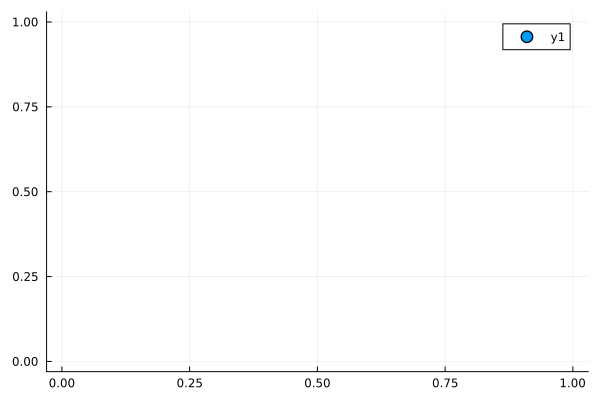

In [243]:
gs = [-0.1,-0.2,-0.3,-0.4,-0.5,-0.7,-1.0,-2.0]
th = 0.005

t_break = []
g_break = []

for g in gs
    dfP = CSV.read("../data/obs_Pert_Dcorr_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    for (n,i) in enumerate(abs.((dfE[:,"N"] .+ dfE[:,"N_corr4"]) .- (dfE[1,"N"] .+ dfE[1,"N_corr4"])) ./ abs(dfE[1,"N"] .+ dfE[1,"N_corr4"]))
        if i > th
            push!(t_break, dfP[n, "t"])
            push!(g_break, g)
            break
        end
    end
end

scatter(abs.(1 ./ g_break),t_break, 
        # yaxis = :log, 
)

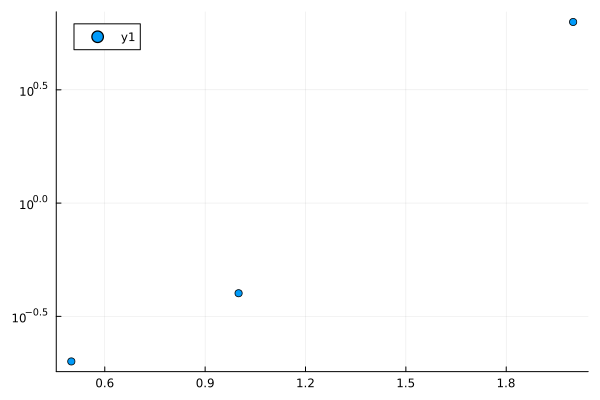

In [286]:
gs = [-0.05,-0.1,-0.2,-0.3,-0.4,-0.5,-1.0,-2.0]
th = 0.2

t_break = []
g_break = []

for g in gs
    dfP = CSV.read("../data/obs_Pert_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    dfE = CSV.read("../data/obs_ED_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)

    for (n,(p,e)) in enumerate(zip(dfP[:,"imb"],dfE[:,"imb"]))
        if abs(p-e) > th
            push!(t_break, dfP[n, "t"])
            push!(g_break, g)
            break
        end
    end
end

scatter(
    abs.(1 ./ g_break),t_break, 
    yaxis = :log, 
)

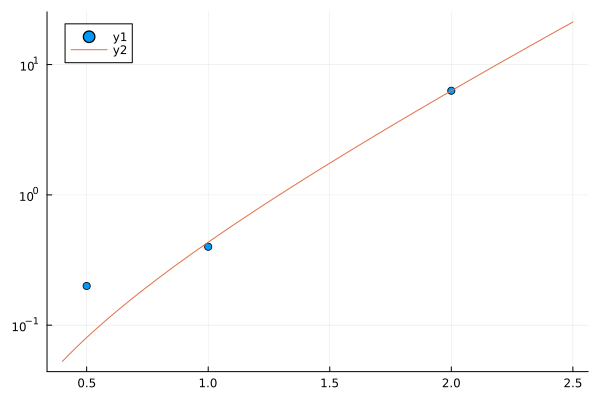

In [281]:
model(t, p) = (p[1] ./ t) .* exp.(p[2] ./ t)
p0 = [0.5,0.5]
fit = curve_fit(model, abs.(g_break), t_break,  p0)


scatter(
    1 ./ abs.(g_break),t_break, 
    yaxis = :log, 
)

x = 0.4:0.01:2.5

plot!(1 ./ x, model(x, fit.param))

In [8]:
## fix string observables ##
gs = [-0.1,-0.2,-0.3,-0.4,-0.5,-0.7,-1.0,-2.0]

for g in gs
    dfE = CSV.read("../data/obs_Pert_Dcorr_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)

    # df = DataFrame(t = dfE[:,"t"], 
    #                imb = dfE[:,"imb"], 
    #                N = dfE[:,"N"], 
    #             #    N_corr1 = [real(parse(ComplexF64, d)) for d in dfE[:,"N_corr1"]], 
    #             #    N_corr2 = [real(parse(ComplexF64, d)) for d in dfE[:,"N_corr2"]], 
    #             #    N_corr3 = [real(parse(ComplexF64, d)) for d in dfE[:,"N_corr3"]], 
    #                N_corr4 = dfE[:,"N_corr4"], 
    #                D = dfE[:,"D"])

    df = DataFrame(t = [real(parse(ComplexF64, d)) for d in dfE[:,"t"]], 
                   imb = [real(parse(ComplexF64, d)) for d in dfE[:,"imb"]], 
                   N = [real(parse(ComplexF64, d)) for d in dfE[:,"N"]], 
                   N_corr1 = [real(parse(ComplexF64, d)) for d in dfE[:,"N_corr1"]], 
                   N_corr2 = [real(parse(ComplexF64, d)) for d in dfE[:,"N_corr2"]], 
                   N_corr3 = [real(parse(ComplexF64, d)) for d in dfE[:,"N_corr3"]], 
                   N_corr4 = [real(parse(ComplexF64, d)) for d in dfE[:,"N_corr4"]], 
                   D = [real(parse(ComplexF64, d)) for d in dfE[:,"D"]])
    CSV.write("../data/obs_ED_Dcorr_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", df)
end


In [83]:
gs = [-0.1,-0.2,-0.3]
vals = [-1.875e-5, -0.0003,-0.00151875]
#   [370]  =  -1.33644e-24

for (g,val) in zip(gs,vals)
    n = 12
    Γ = n * 2π * abs2(val)
    @printf "g = %f, t_H = %e, 1/g^4 = %e" g 1/Γ 1/g^4
    println()
end

g = -0.100000, t_H = 3.772562e+07, 1/g^4 = 1.000000e+04
g = -0.200000, t_H = 1.473657e+05, 1/g^4 = 6.250000e+02
g = -0.300000, t_H = 5.749980e+03, 1/g^4 = 1.234568e+02


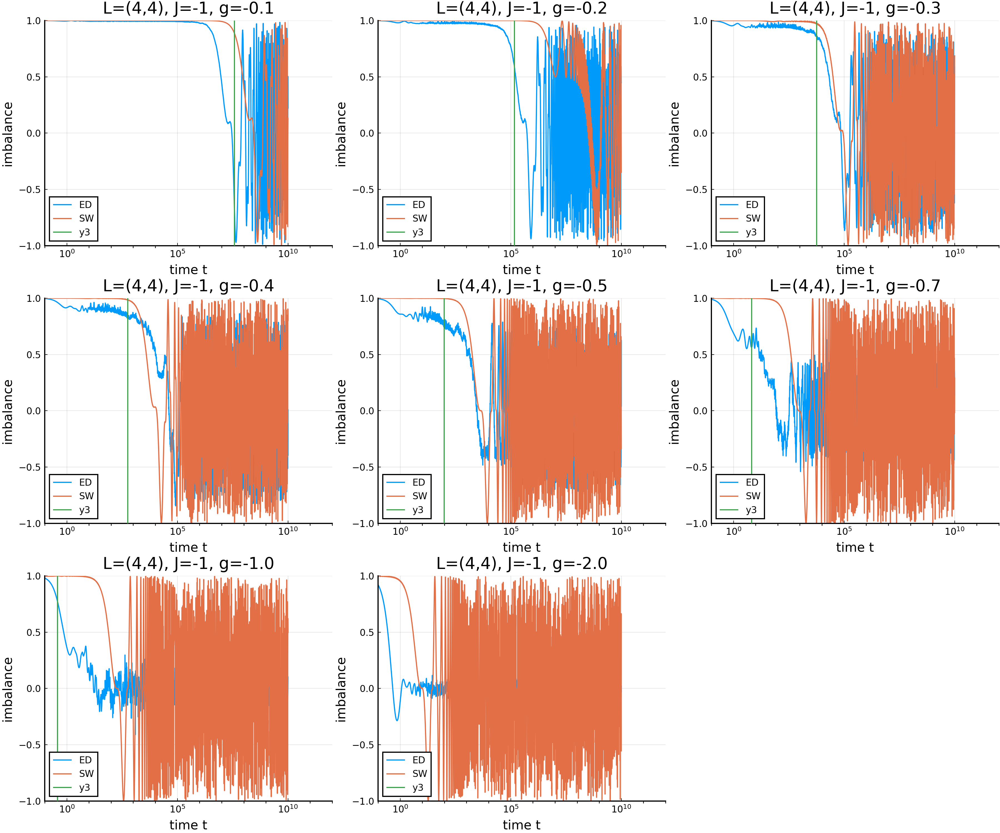

In [49]:

L = (4,4)
J = -1
# g = -0.5
h = -0.

gs = [-0.1,-0.2,-0.3,-0.4,-0.5,-0.7,-1.0,-2.0]
vals = [-1.875e-5, -0.0003,-0.00151875,-0.0048,-0.0117188,-0.0450187,-0.1875,-3]

pimbs = map(zip(gs,vals)) do (g,val)
    dfE = CSV.read("../data/obs_ED_longtime_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    # dfS = CSV.read("../data/obs_ED_longtime_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)
    dfS = CSV.read("../data/obs_SW_longtime_L=($(L[1])_$(L[2]))_J=$(J)_g=$(g)_h=$(h).csv", DataFrame)

    plot(title = "L=($(L[1]),$(L[2])), J=$(J), g=$(g)", xlabel = "time t", ylabel = "imbalance",
                xlim = (0.1,1e12), xaxis = :log,
                ylim = (-1,1),
                legend = :bottomleft,
            )

    n = 12
    Γ = n * 2π * abs2(val)

    plot!(dfE[:,"t"], dfE[:,"imb"], label="ED")
    plot!(dfS[:,"t"], dfS[:,"imb"], label="SW")
    vline!([1/Γ])

    # plot!(dfE[:,"t"], (dfE[:,"N"] .+ dfE[:,"N_corr"]) .- (dfE[1,"N"] + dfE[1,"N_corr"]), label="ED")
    # plot!(dfS[:,"t"], (dfS[:,"N"] .+ dfS[:,"N_corr"]) .- (dfS[1,"N"] + dfS[1,"N_corr"]), label="SW")

    # plot!(dfE[:,"t"], dfE[:,"N"], label="ED")
    # plot!(dfS[:,"t"], dfS[:,"N"], label="SW")
end

plot(pimbs..., dpi=300, size = (1200,1000))